In [64]:
import pandas as pd
df = pd.read_csv('full_database.csv')
df.head()
df = df.drop(df.columns[0], axis=1)
df = df.drop(df.columns[0], axis=1)

In [65]:
df.head()

,cuisine,recipe_ingredients,recipe_name
0,african,2 tbsp vegetable oil ½ tsp cumin seeds ½ tsp f...,Bunny chow
1,african,"1 tbsp olive or vegetable oil 2 large onions, ...",Jollof rice with fried plantains
2,african,400ml/14fl oz passata 3 tbsp tomato purée 2 fr...,Jollof rice
3,african,4g smoked paprika 2g cayenne pepper 6g ginger...,Suya fillet burger with sweet potato cubes and...
4,african,300g/10½oz basmati rice 1 tbsp vegetable oil 8...,Jollof rice with chicken


In [66]:
df.cuisine.value_counts()

greek                         166
thai_and_south-east_asian     158
irish                         149
american                      147
indian                        146
french                        139
japanese                      137
african                       127
korean                        118
italian                       105
mexican                       103
chinese                        74
british                        67
turkish_and_middle_eastern     64
pakistani                      24
nordic                         24
caribbean                      24
spanish                        24
east_european                  24
south_american                 18
portuguese                     15
Name: cuisine, dtype: int64

In [160]:
df = df.groupby('cuisine').filter(lambda x: len(x) >= 50)

In [164]:
df.to_csv('final_database.csv')

## Checking for Class Balance

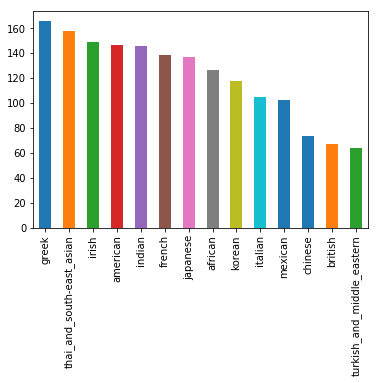

In [162]:
df['cuisine'].value_counts().plot(kind='bar')

In [68]:
import wordcloud
import matplotlib.pyplot as plt

In [69]:
' '.join(w for w in df[df.cuisine == "greek"].recipe_ingredients.tolist())

'750g/1lb 10½oz lamb mince 1 onion, finely chopped 2 garlic cloves, crushed 1 tsp dried oregano 1½ tsp dried mint 1 bay leaf 1 cinnamon stick 1 tbsp plain flour 200ml/7fl oz red wine 400g tin chopped tomatoes 2 tbsp tomato purée 2 aubergines, cut into 0.5cm slices 1 tbsp fine sea salt, plus extra for seasoning 100ml/3½fl oz olive oil 500g/1lb 2oz Maris Piper potatoes, peeled and thinly sliced freshly ground black pepper 50g/2oz butter 50g/2oz plain flour 400ml/14fl oz milk 25g/1oz Parmesan, finely grated 1 tsp finely grated nutmeg 1 free-range egg, beaten 150-175ml/5-6fl oz olive oil 1 large onion, finely chopped 3 garlic cloves, crushed 900g/2lb lamb mince 50ml/2 fl oz white wine (a generous splash) 1 x 400g tin chopped tomatoes 1 x 5cm/2in piece cinnamon stick handful fresh oregano leaves, preferably wild Greek oregano, chopped 3 large aubergines salt and freshly ground black pepper 75g/3oz butter 75g/3oz plain flour 600ml/1 pint milk 50g/2oz parmesan cheese, finely grated 2 medium f

## Creating Word Clouds For Each Class

In [198]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import string

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Clementine/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [200]:
ntlk_stopwords = stopwords.words('english')+list(string.punctuation)
ntlk_stopwords
stopwords = ntlk_stopwords+['1','2','3','4','5','6','7','8','9', 'tsp','tbsp',
             'tablespoon', 'teaspoon', 'tablespoons', 'teaspoons', 
             'large', 'cup', 'ounces', 'pound', 'oz', 'slice','sliced', 
             'cup', 'cups', 'ounce', 'ounces', 'chopped', 'finely', 'cut',
            'thinly']
stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

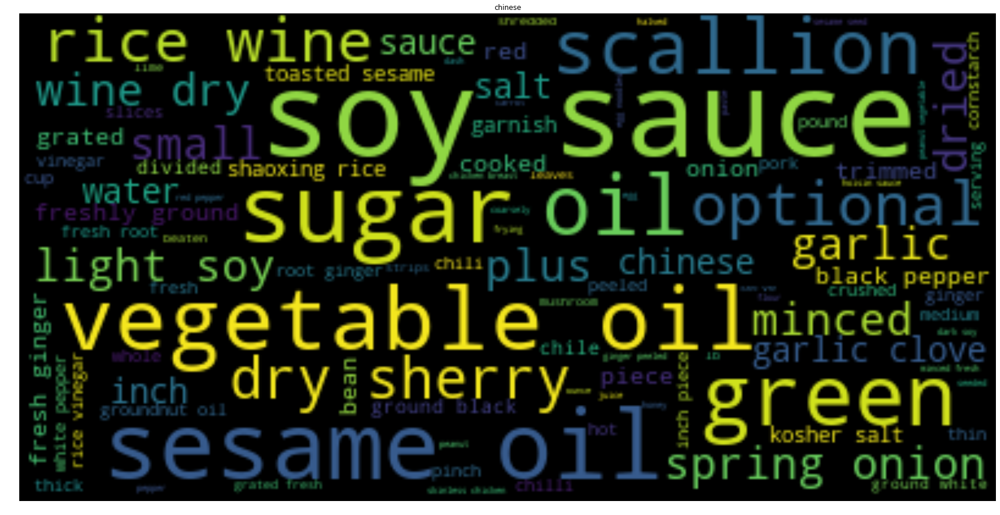

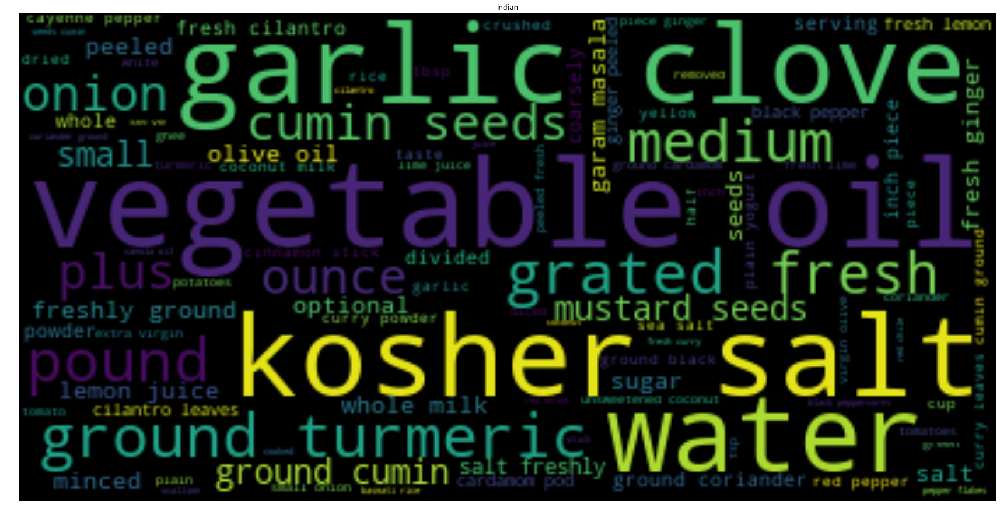

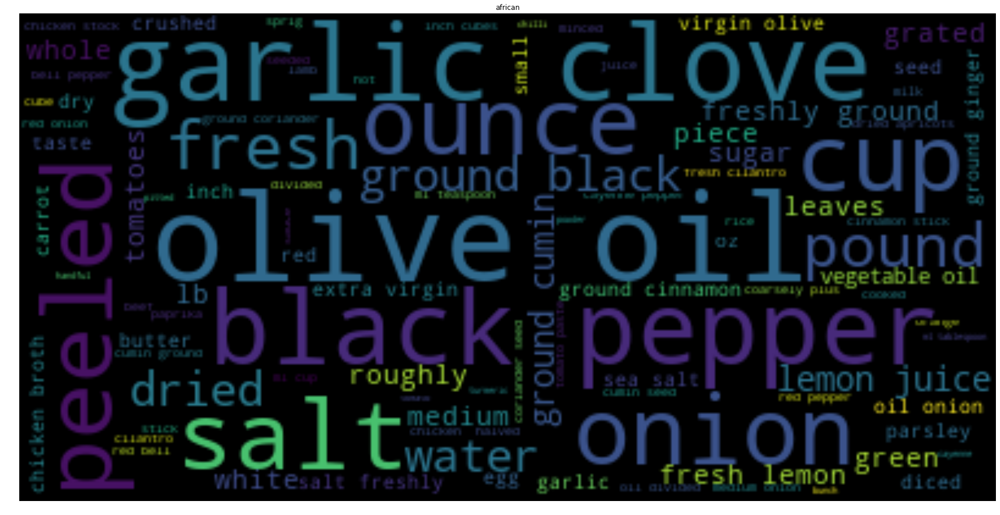

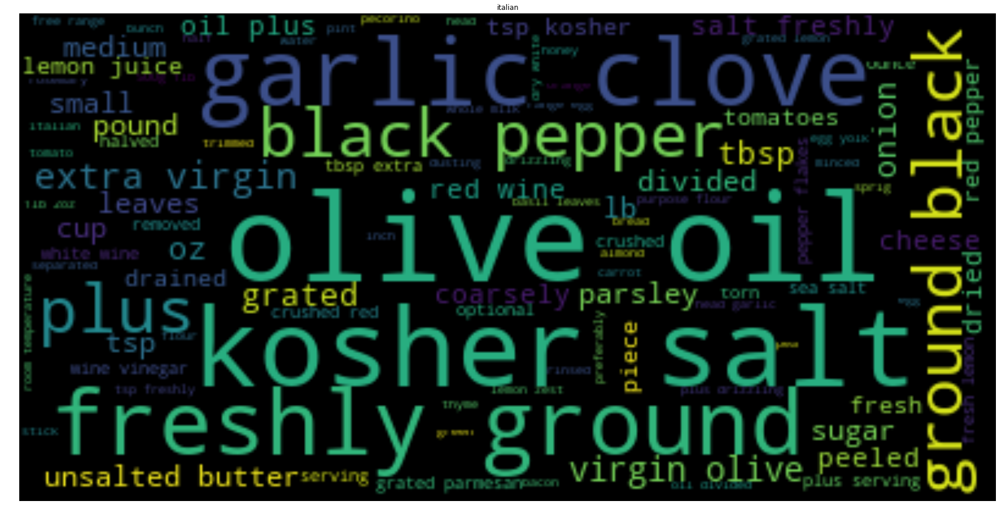

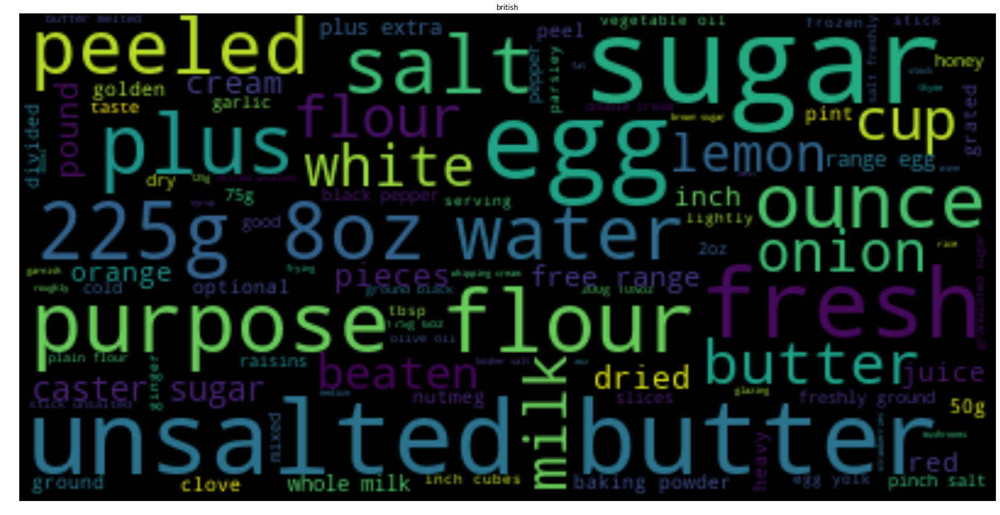

...

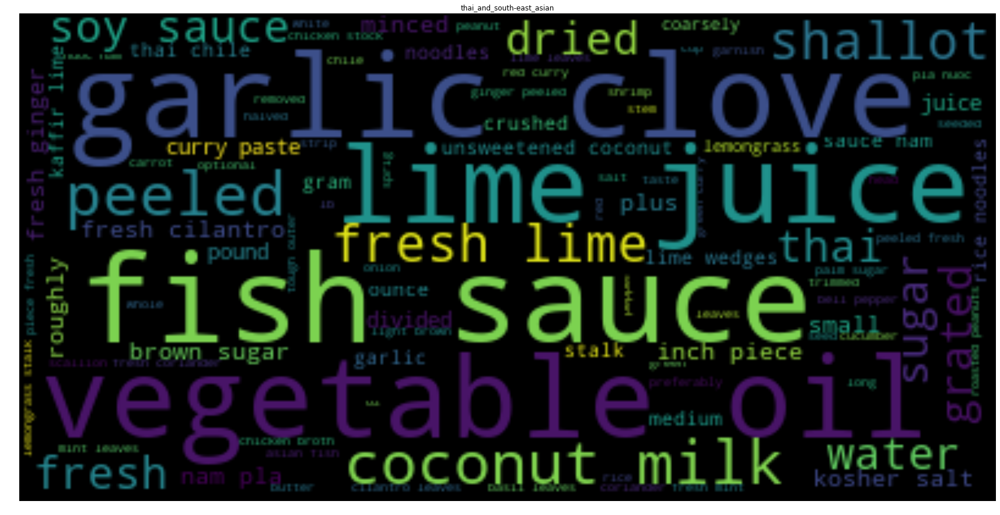

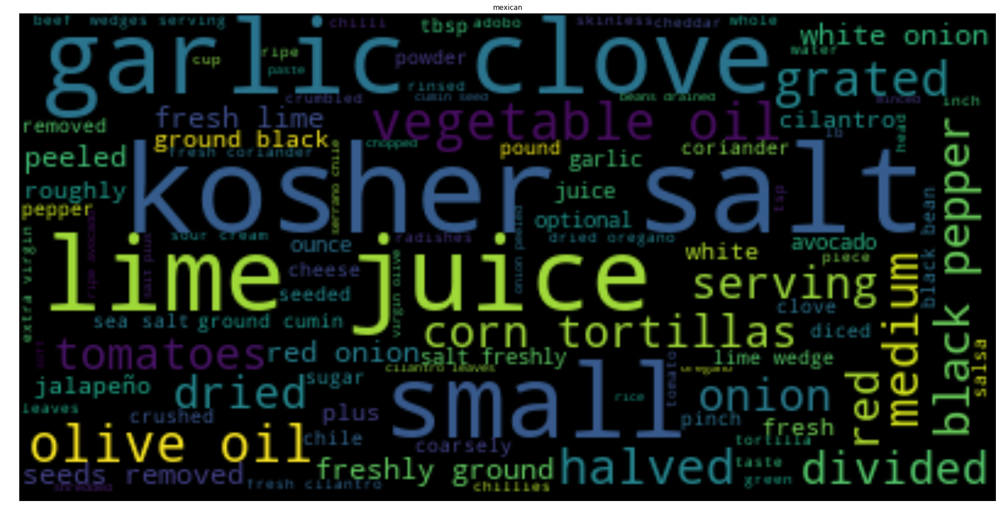

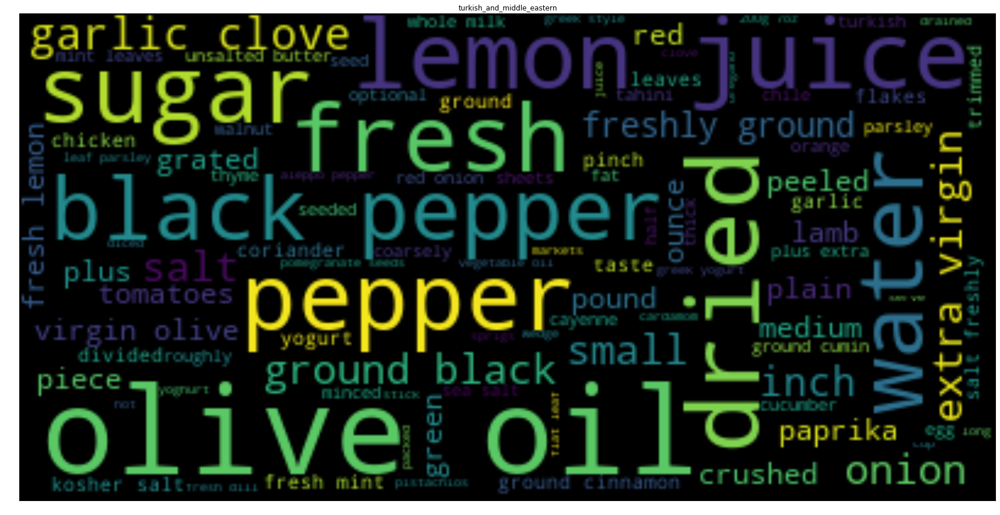

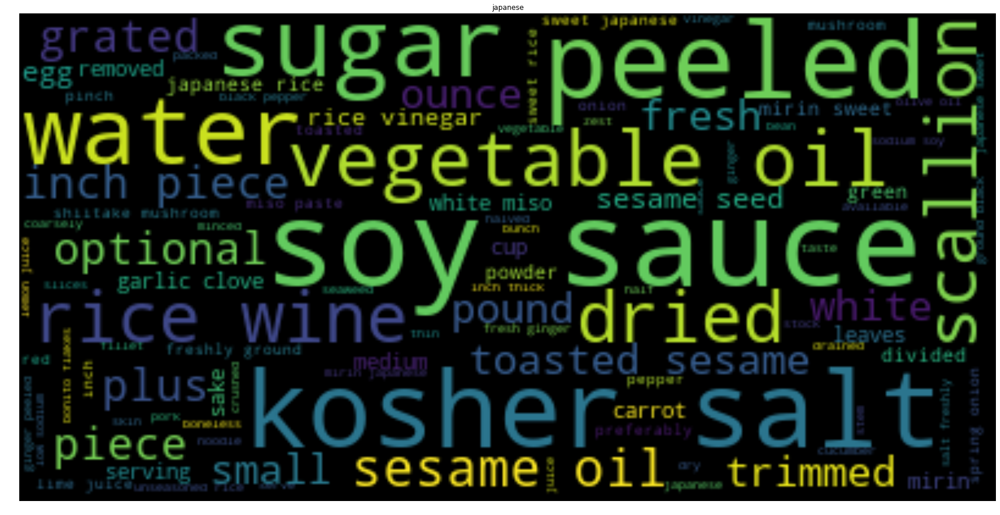

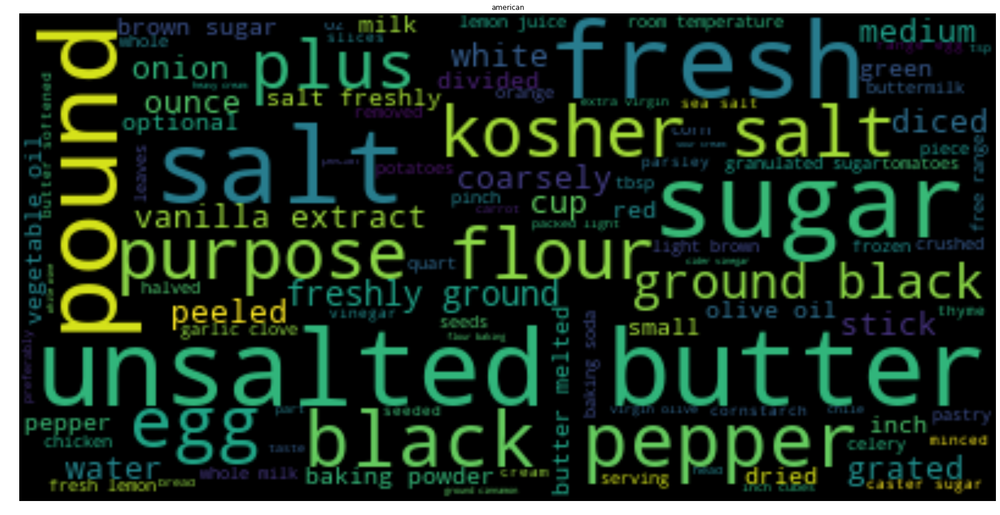

In [201]:
cuisines = set(df.cuisine.tolist())
stopwords = ntlk_stopwords+['1','2','3','4','5','6','7','8','9', 'tsp','tbsp',
             'tablespoon', 'teaspoon', 'tablespoons', 'teaspoons', 
             'large', 'cup', 'ounces', 'pound', 'oz', 'slice','sliced', 
             'cup', 'cups', 'ounce', 'ounces', 'chopped', 'finely', 'cut',
            'thinly']


for cuisine in cuisines:
    all_words = []
    for recipe in df[df.cuisine == cuisine].recipe_ingredients.tolist():
        words = recipe.split()
        all_words += words
    text = ' '.join([w.lower() for w in all_words if w not in stopwords])
    wordcloud = WordCloud(max_font_size=50, max_words=100).generate(text)
    plt.figure(figsize=(30,20))
    plt.title(cuisine)
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    


## Feature Engineering
### Count Vectors
#### TF-IDF Vectors as Features
#### Word Level
#### N-Gram Level

In [202]:
all_words = []
for recipe in df[df.cuisine == "chinese"].recipe_ingredients.tolist():
    words = recipe.split()
    all_words += words
text = ' '.join([w.lower().replace(',','') for w in all_words if w not in stopwords])


In [203]:
text

'225g/8oz egg noodles sesame oil 100g/4oz chicken breast skinned 2½ garlic 50g/2oz mangetout trimmed 50g/2oz parma ham cooked ham shredded light soy sauce dark soy sauce shaoxing rice wine dry sherry ½ salt ½ freshly ground white pepper ½ sugar spring onions sesame oil light soy sauce shaoxing rice wine dry sherry sesame oil ½ salt ½ freshly ground white pepper grated fresh root ginger shaoxing rice wine dry sherry ground sichuan peppercorns pinch salt taste (optional) whole star anise dark soy sauce light soy sauce duck breasts skin scored criss-cross pattern groundnut oil salad leaves serve 100ml/3½fl water plums stones removed quartered 50g/2oz dried apricots 2½ caster sugar honey cinnamon stick whole star anise lime juice 300g/10½oz king prawns raw peeled oyster sauce groundnut oil toasted sesame oil ¼ fine sea salt ½ grated fresh root ginger 50g/1¾oz tinned bamboo shoots drained 100g/3½oz sesame seeds oil deep-frying dark soy sauce sweet chilli sauce serve 150g/5½oz long grain bas

In [204]:
import nltk
from nltk import word_tokenize
from nltk.util import ngrams
from collections import Counter

token = nltk.word_tokenize(text)
bigrams = ngrams(token,2)
trigrams = ngrams(token,3)
fourgrams = ngrams(token,4)
fivegrams = ngrams(token,5)

print(Counter(bigrams))
#  Counter({('program', 'in'): 2, ('NLTK', 'that'): 2, ('that', 'breaks'): 2,
#  ('write', 'a'): 2, ('breaks', 'a'): 2, ('to', 'write'): 2, ('I', 'need'): 2,
#  ('a', 'corpus'): 2, ('need', 'to'): 2, ('a', 'program'): 2, ('in', 'NLTK'): 2,
#  ('and', 'fivegrams'): 1, ('corpus', '('): 1, ('txt', 'files'): 1, ('unigrams', 
# ','): 1, (',', 'trigrams'): 1, ('into', 'unigrams'): 1, ('trigrams', ','): 1,
#  (',', 'bigrams'): 1, ('large', 'collection'): 1, ('bigrams', ','): 1, ('of',
#  'txt'): 1, (')', 'into'): 1, ('fourgrams', 'and'): 1, ('fivegrams', '.'): 1,
#  ('(', 'a'): 1, (',', 'fourgrams'): 1, ('a', 'large'): 1, ('.', 'I'): 1, 
# ('collection', 'of'): 1, ('files', ')'): 1})

Counter({('soy', 'sauce'): 64, ('sesame', 'oil'): 35, ('vegetable', 'oil'): 29, ('rice', 'wine'): 23, ('dry', 'sherry'): 23, ('light', 'soy'): 22, ('wine', 'dry'): 22, ('(', 'optional'): 21, ('optional', ')'): 20, ('freshly', 'ground'): 19, ('(', 'about'): 19, ('garlic', 'cloves'): 17, ('black', 'pepper'): 17, ('fresh', 'ginger'): 16, ('shaoxing', 'rice'): 15, ('toasted', 'sesame'): 15, ('kosher', 'salt'): 15, ('spring', 'onions'): 14, ('ground', 'black'): 14, ('groundnut', 'oil'): 13, ('white', 'pepper'): 12, ('fresh', 'root'): 12, ('root', 'ginger'): 12, ('rice', 'vinegar'): 11, ('ground', 'white'): 10, ('grated', 'fresh'): 10, ('red', 'pepper'): 9, ('spring', 'onion'): 9, ('sauce', '('): 9, ('peanut', 'vegetable'): 9, ('(', 'for'): 9, ('egg', 'noodles'): 8, ('dark', 'soy'): 8, ('sesame', 'seeds'): 8, ('ginger', 'peeled'): 8, ('oil', '('): 8, ('(', 'or'): 8, ('skinless', 'chicken'): 8, ('hoisin', 'sauce'): 8, ('minced', 'fresh'): 8, ('cups', ')'): 8, ('oyster', 'sauce'): 7, ('chicken